In [1]:
%matplotlib inline

import os
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import harmonypy
from cnmf import cNMF
import seaborn as sns
import yaml
from scipy.stats import pearsonr
from IPython.display import Image
from matplotlib.pyplot import rc_context

sys.path.append('../../../Code/')
from utils import read_dataset_log, match_columns

In [2]:
paths ={
 'RNA_Varnorm_Harmony': '../../../Data/PerDataset/AMPRA/AMP_ADT.RNA_counts.raw.ADTfixed.ADT_20.RNA.VarNorm.HVG.HarmonyGeneCorrect.h5ad',
 'RNA_HVG_List': '../../../Data/PerDataset/AMPRA/AMP_ADT.RNA_counts.raw.ADTfixed.ADT_20.RNA.HVGlist.tsv',
 'Metadata': '../../../Data/PerDataset/AMPRA/AMP_ADT.RNA_counts.raw.ADTfixed.ADT_20.metadata.tsv',
 'RNA_and_ADT_TP10K': '../../../Data/PerDataset/AMPRA/AMP_ADT.RNA_counts.raw.ADTfixed.ADT_20.RNA_and_ADT.TP10K.h5ad',
 'WNN_UMAP': '../../../Data/PerDataset/AMPRA/AMP_ADT.RNA_counts.raw.ADTfixed.ADT_20.RNA_and_ADT.TP10K.VarNorm.HVG.HarmonyGeneCorrect.WNN.UMAP.tsv'}

In [3]:
! pwd

/data/srlab1/TCAT/Analysis/PerDataset/AMPRA


# Run cNMF

In [6]:
cnmfdir = '../../../Data/PerDataset/AMPRA'
name = 'AMPRA.20230912'

In [5]:
! ls ../../../Data/PerDataset/AMPRA/AMPRA.20230912/cnmf_tmp

AMPRA.20230912.nmf_idvrun_params.yaml
AMPRA.20230912.nmf_params.df.npz
AMPRA.20230912.norm_counts.h5ad
AMPRA.20230912.spectra.k_15.iter_0.df.npz
AMPRA.20230912.spectra.k_15.iter_10.df.npz
AMPRA.20230912.spectra.k_15.iter_11.df.npz
AMPRA.20230912.spectra.k_15.iter_12.df.npz
AMPRA.20230912.spectra.k_15.iter_13.df.npz
AMPRA.20230912.spectra.k_15.iter_14.df.npz
AMPRA.20230912.spectra.k_15.iter_15.df.npz
AMPRA.20230912.spectra.k_15.iter_16.df.npz
AMPRA.20230912.spectra.k_15.iter_17.df.npz
AMPRA.20230912.spectra.k_15.iter_18.df.npz
AMPRA.20230912.spectra.k_15.iter_19.df.npz
AMPRA.20230912.spectra.k_15.iter_1.df.npz
AMPRA.20230912.spectra.k_15.iter_2.df.npz
AMPRA.20230912.spectra.k_15.iter_3.df.npz
AMPRA.20230912.spectra.k_15.iter_4.df.npz
AMPRA.20230912.spectra.k_15.iter_5.df.npz
AMPRA.20230912.spectra.k_15.iter_6.df.npz
AMPRA.20230912.spectra.k_15.iter_7.df.npz
AMPRA.20230912.spectra.k_15.iter_8.df.npz
AMPRA.20230912.spectra.k_15.iter_9.df.npz
AMPRA.20230912.spectra.k_16.iter_0.df.npz
AMPRA

In [14]:
cnmf_count_fn = paths['RNA_Varnorm_Harmony']
cnmf_tpm_fn = paths['RNA_and_ADT_TP10K']
hvg_fn = paths['RNA_HVG_List']

jname = name
cnmfout = os.path.join(cnmfdir, name, 'log')

Ks = np.arange(15, 55)
n_iter = 20
num_per_node = 10

In [7]:
cnmf_obj = cNMF(output_dir=cnmfdir, name=name)

In [10]:
cnmf_obj.prepare(counts_fn=cnmf_count_fn, components=Ks,
                 n_iter=n_iter, tpm_fn=cnmf_tpm_fn, genes_file=hvg_fn, init='random')

Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].


In [11]:
total_workers = int((len(Ks)*n_iter) / num_per_node)
total_workers

80

In [13]:
cnmfout

'../../../Data/PerDataset/AMPRA/AMPRA.20230912/log'

In [14]:
if not os.path.exists(cnmfout): os.mkdir(cnmfout)

basecmd = "export OMP_NUM_THREADS=6; cnmf factorize --name {name} --output-dir {outdir} --total-workers {tw} --worker-index {i}"
q = 'short'
other = '-R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]"'

for i in range(total_workers):
    cmd = basecmd.format(name=name, outdir=cnmfdir, i=i, tw=total_workers)
    e = os.path.join(cnmfout, '{j}.{i}.err.txt').format(i=i, j=jname)
    o = os.path.join(cnmfout, '{j}.{i}.out.txt').format(i=i, j=jname)
    bsub_cmd = 'bsub -q {q} -J {j} -o {o} -e {e} {other} "{cmd}"'.format(q=q, j=jname, e=e, o=o, other=other, cmd=cmd)
    print(bsub_cmd)
    !{bsub_cmd}

bsub -q short -J AMPRA.20230912 -o ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.0.out.txt -e ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.0.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name AMPRA.20230912 --output-dir ../../../Data/PerDataset/AMPRA --total-workers 80 --worker-index 0"
Job <843565> is submitted to queue <short>.
bsub -q short -J AMPRA.20230912 -o ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.1.out.txt -e ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.1.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name AMPRA.20230912 --output-dir ..

In [ ]:
! bjobs | wc -l

In [9]:
total_workers = int((len(Ks)*n_iter))
total_workers

800

In [20]:
! pwd

/data/srlab1/TCAT/Analysis/PerDataset/AMPRA


In [18]:
import os
def worker_filter(iterable, worker_index, total_workers):
    return (p for i,p in enumerate(iterable) if (i-worker_index)%total_workers==0)

def load_df_from_npz(filename):
    with np.load(filename, allow_pickle=True) as f:
        obj = pd.DataFrame(**f)
    return obj

missing = []
run_params = load_df_from_npz(cnmf_obj.paths['nmf_replicate_parameters'])
for worker_i in range(total_workers):
    jobs_for_this_worker = worker_filter(range(len(run_params)), worker_i, total_workers)
    for idx in jobs_for_this_worker:
        p = run_params.iloc[idx, :]
        outfn = cnmf_obj.paths['iter_spectra'] % (p['n_components'], p['iter'])
        if not os.path.exists(outfn):
            print(worker_i, outfn)
            missing.append(worker_i)

In [19]:
len(missing)

0

In [ ]:
! bjobs | wc -l

In [17]:
if not os.path.exists(cnmfout): os.mkdir(cnmfout)

basecmd = "export OMP_NUM_THREADS=6; cnmf factorize --name {name} --output-dir {outdir} --total-workers {tw} --worker-index {i}"
q = 'medium'
other = '-R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]"'

for i in missing:
    cmd = basecmd.format(name=name, outdir=cnmfdir, i=i, tw=total_workers)
    e = os.path.join(cnmfout, '{j}.{i}.err.txt').format(i=i, j=jname)
    o = os.path.join(cnmfout, '{j}.{i}.out.txt').format(i=i, j=jname)
    bsub_cmd = 'bsub -q {q} -J {j} -o {o} -e {e} {other} "{cmd}"'.format(q=q, j=jname, e=e, o=o, other=other, cmd=cmd)
    print(bsub_cmd)
    !{bsub_cmd}

bsub -q medium -J AMPRA.20230912 -o ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.625.out.txt -e ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.625.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name AMPRA.20230912 --output-dir ../../../Data/PerDataset/AMPRA --total-workers 800 --worker-index 625"
Job <844302> is submitted to queue <medium>.
bsub -q medium -J AMPRA.20230912 -o ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.773.out.txt -e ../../../Data/PerDataset/AMPRA/AMPRA.20230912/log/AMPRA.20230912.773.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name AMPRA.20230912 -

In [20]:
cnmf_obj.combine(skip_missing_files=True)

Combining factorizations for k=15.
Combining factorizations for k=16.
Combining factorizations for k=17.
Combining factorizations for k=18.
Combining factorizations for k=19.
Combining factorizations for k=20.
Combining factorizations for k=21.
Combining factorizations for k=22.
Combining factorizations for k=23.
Combining factorizations for k=24.
Combining factorizations for k=25.
Combining factorizations for k=26.
Combining factorizations for k=27.
Combining factorizations for k=28.
Combining factorizations for k=29.
Combining factorizations for k=30.
Combining factorizations for k=31.
Combining factorizations for k=32.
Combining factorizations for k=33.
Combining factorizations for k=34.
Combining factorizations for k=35.
Combining factorizations for k=36.
Combining factorizations for k=37.
Combining factorizations for k=38.
Combining factorizations for k=39.
Combining factorizations for k=40.
Combining factorizations for k=41.
Combining factorizations for k=42.
Combining factorizat

Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
CPU times: user 1h 51min 25s, sys: 2h 56min 42s, total: 4h 48min 8s
Wall time: 7min 51s


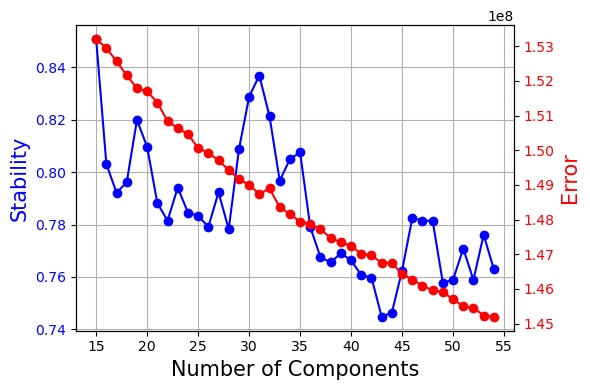

In [21]:
%%time
cnmf_obj.k_selection_plot()

In [14]:
figdir = '../../../Figures/Components'

In [33]:
cmd = 'cp -i {} {}'.format(cnmf_obj.paths['k_selection_plot'], 
                           os.path.join(figdir, '%s.k_selection.png' % name))

print(cmd)

cp -i ../../../Data/PerDataset/AMPRA/AMPRA.20230912/AMPRA.20230912.k_selection.png ../../../Figures/Components/AMPRA.20230912.k_selection.png


In [35]:
print(cmd)
! {cmd}

In [16]:
kthresh = {31:0.2, 32:0.2, 34:.2, 35:.2, 39:.2, 46:.2, 47:.2, 48:.2}


In [8]:
kthresh.keys()

dict_keys([31, 32, 34, 35, 39, 46, 47, 48])

Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


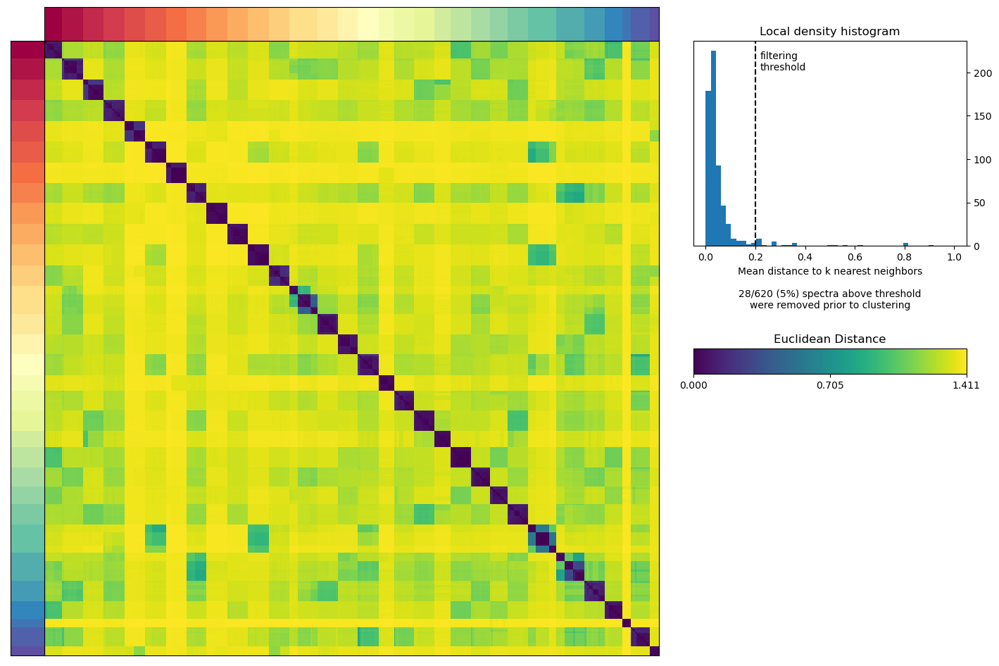

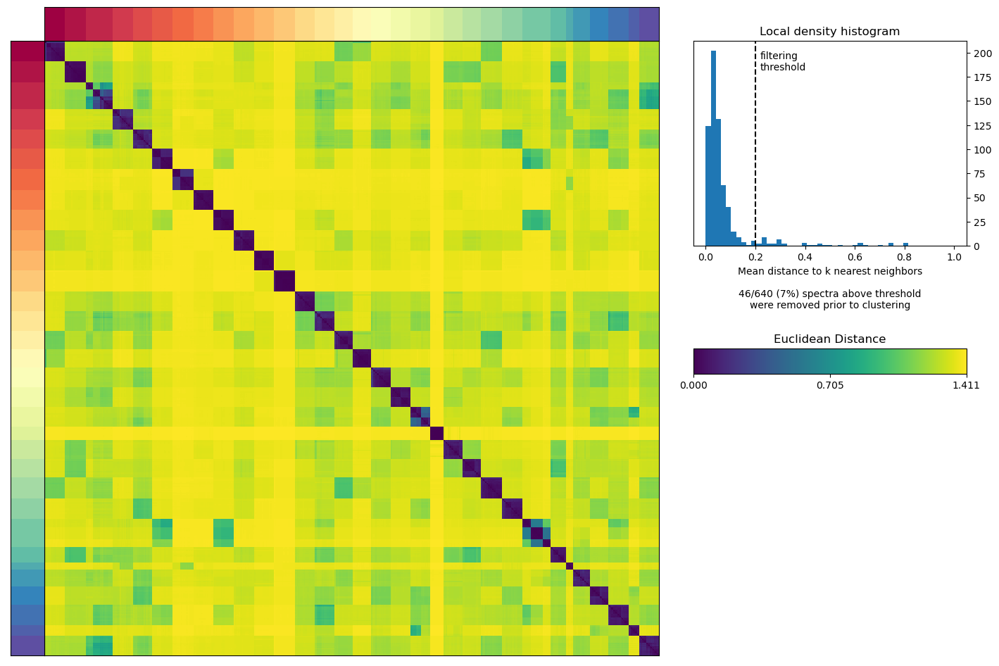

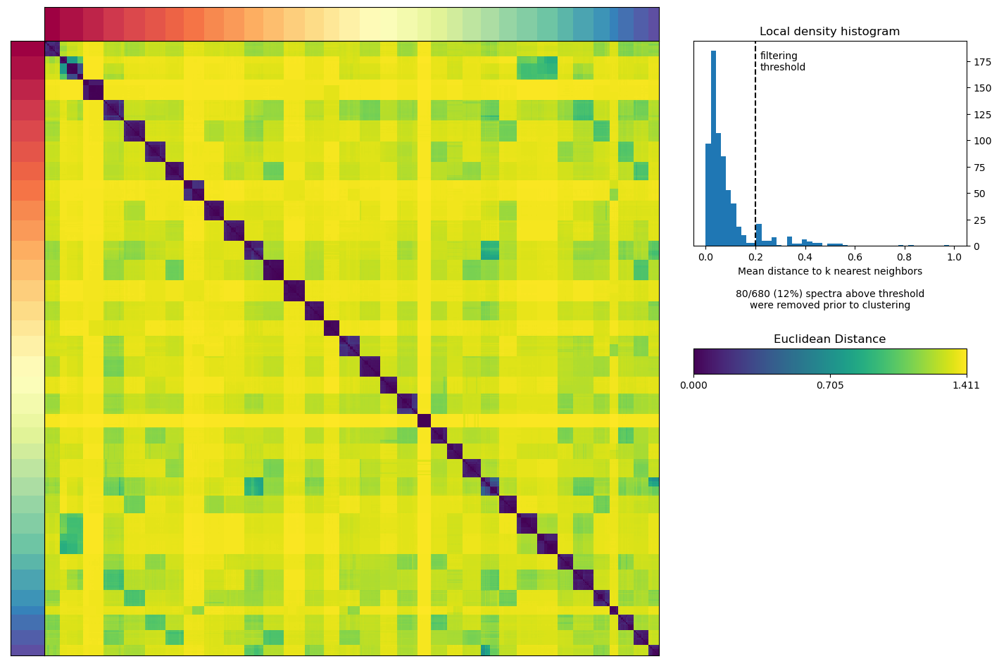

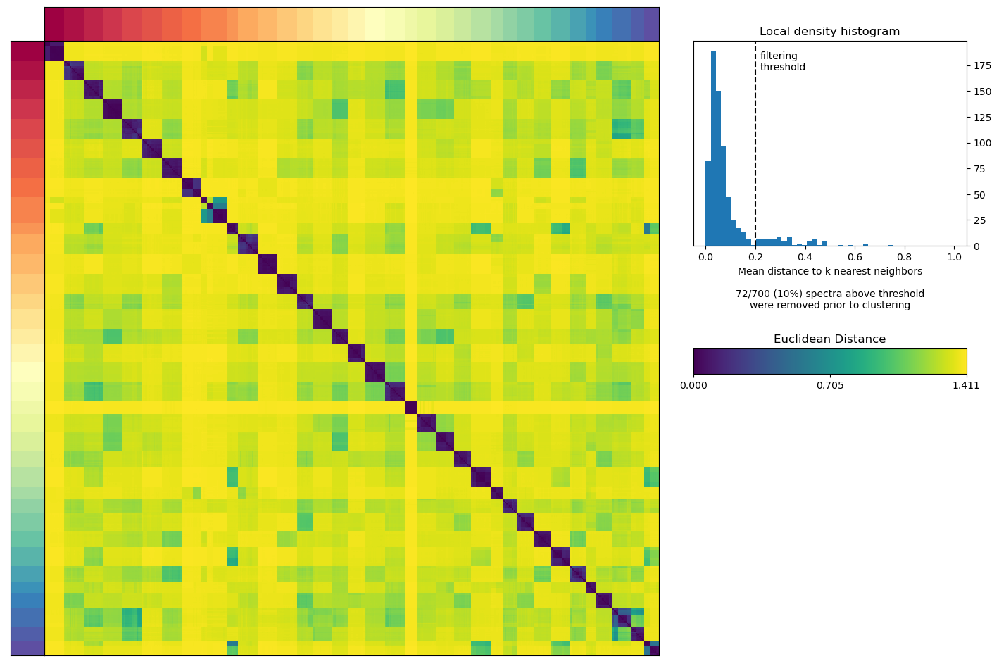

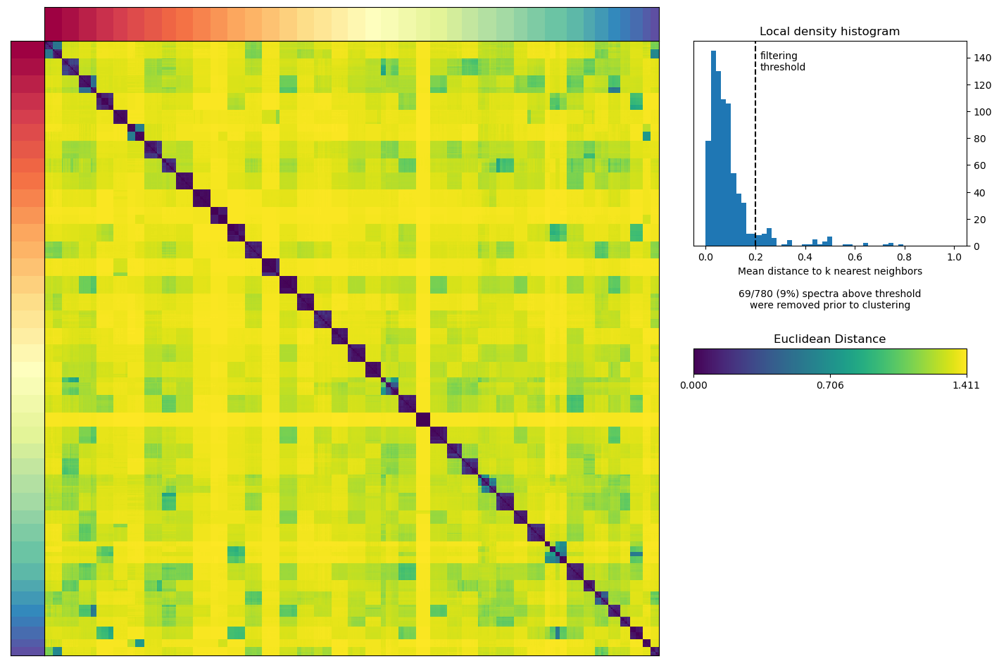

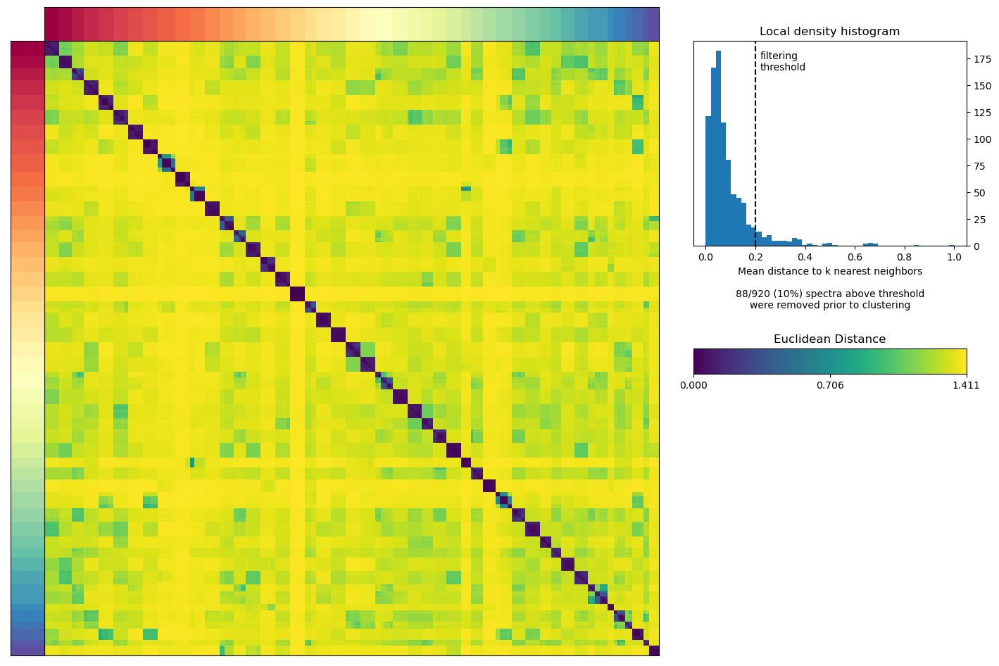

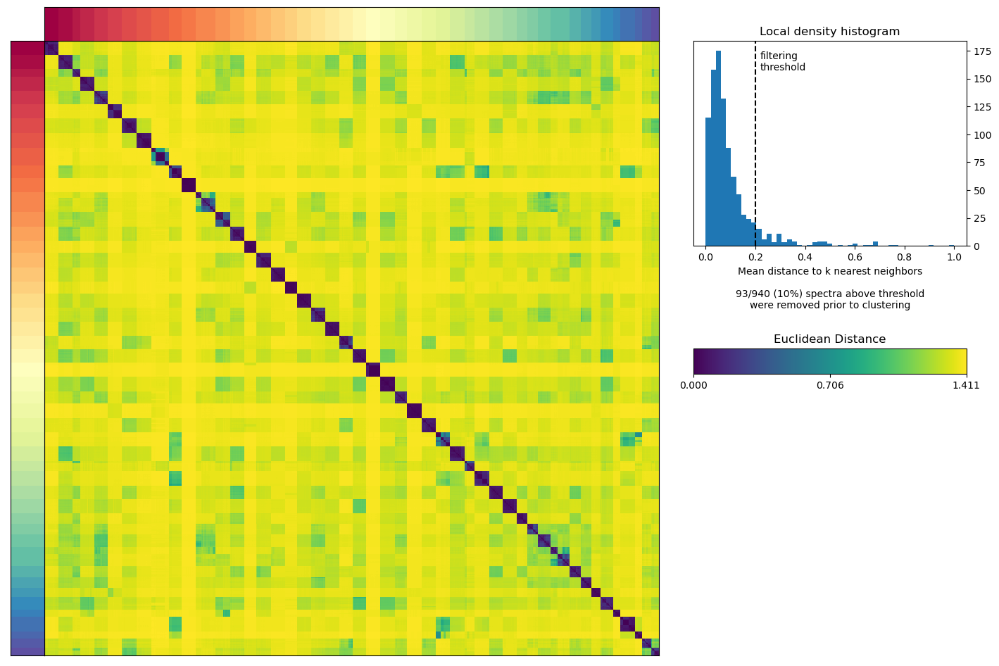

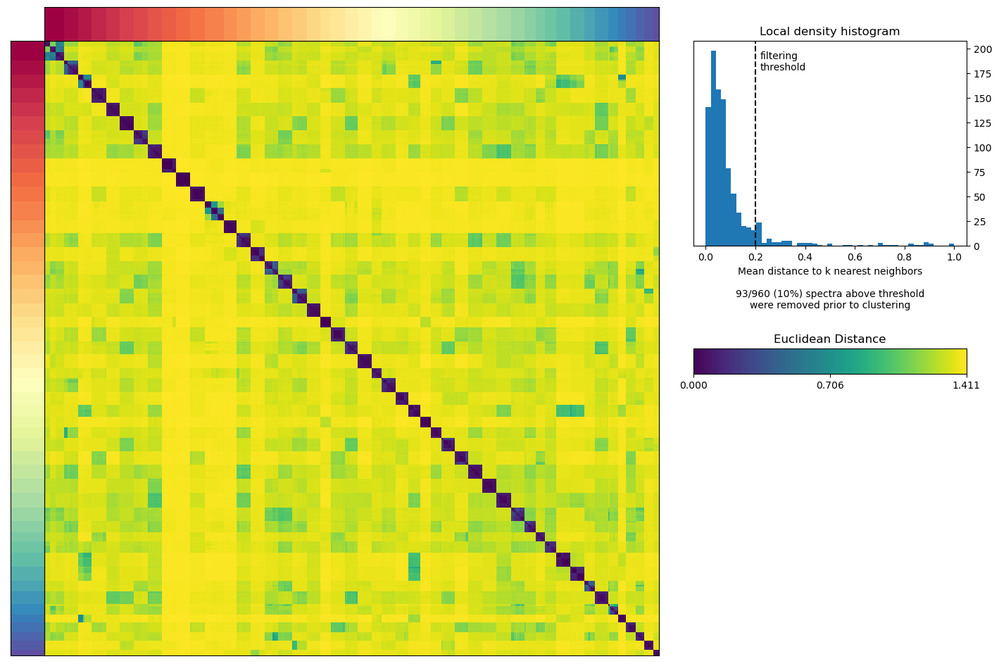

In [10]:
for k in kthresh.keys():
    cnmf_obj.consensus(k=k, density_threshold=kthresh[k])

## Compare with original TCATs

In [17]:
metagepinfo = read_dataset_log(tabname='Current Meta-program Paths').loc[0,:]
metagepinfo

clustering_fn                      /data/srlab1/TCAT/Data/TCAT/cluster_groups.pai...
clustering_with_singletons_fn      /data/srlab1/TCAT/Data/TCAT/cluster_groups.pai...
merged_hvgs                        /data/srlab1/TCAT/Data/TCAT/MergedHVG.UnionAll...
tpm_norm_spectra                   /data/srlab1/TCAT/Data/TCAT/merged_spectra.Gen...
tpm_norm_spectra_withsingletons    /data/srlab1/TCAT/Data/TCAT/merged_spectra.Gen...
scores_spectra                     /data/srlab1/TCAT/Data/TCAT/merged_spectra.Gen...
Name: 0, dtype: object

In [18]:
clustering = pd.read_csv(metagepinfo.loc['clustering_with_singletons_fn'], sep='\t', index_col=0)
clustering.head()

,AMP-RA,UK-Covid,Pan-Tissue,HIV-Vaccine,COMBAT,TBRU,Pan-Cancer
CellCycle-G2M_CellCycle_G2M,AMP-RA:CellCycle-G2M,UK-Covid:CellCycle_G2M,Pan-Tissue:CellCycle-G2M,HIV-Vaccine:CellCycle_G2M,COMBAT:CellCycle_G2M,TBRU:CellCycle_G2M,Pan-Cancer:CellCycle-G2M
ISG,AMP-RA:ISG,UK-Covid:ISG,Pan-Tissue:ISG,HIV-Vaccine:ISG,COMBAT:ISG,TBRU:ISG,Pan-Cancer:ISG
gdT,NaN,UK-Covid:gdT,NaN,HIV-Vaccine:gdT,COMBAT:gdT,TBRU:gdT,NaN
Metallothionein,AMP-RA:Metallothionein,UK-Covid:Metallothionein,Pan-Tissue:Metallothionein,NaN,COMBAT:Metallothionein,NaN,Pan-Cancer:Metallothionein
CellCycle-Sphase_CellCycle_S_DTL/FAM111B,AMP-RA:CellCycle-Sphase,UK-Covid:CellCycle_S,Pan-Tissue:CellCycle-Sphase,HIV-Vaccine:CellCycle_S,COMBAT:CellCycle_S,TBRU:DTL/FAM111B,Pan-Cancer:CellCycle-Sphase


In [19]:
tcat_spectra_all = pd.read_csv(metagepinfo.loc['scores_spectra'], sep='\t', index_col=0).T

In [20]:
kthresh.keys()

dict_keys([31, 32, 34, 35, 39, 46, 47, 48])

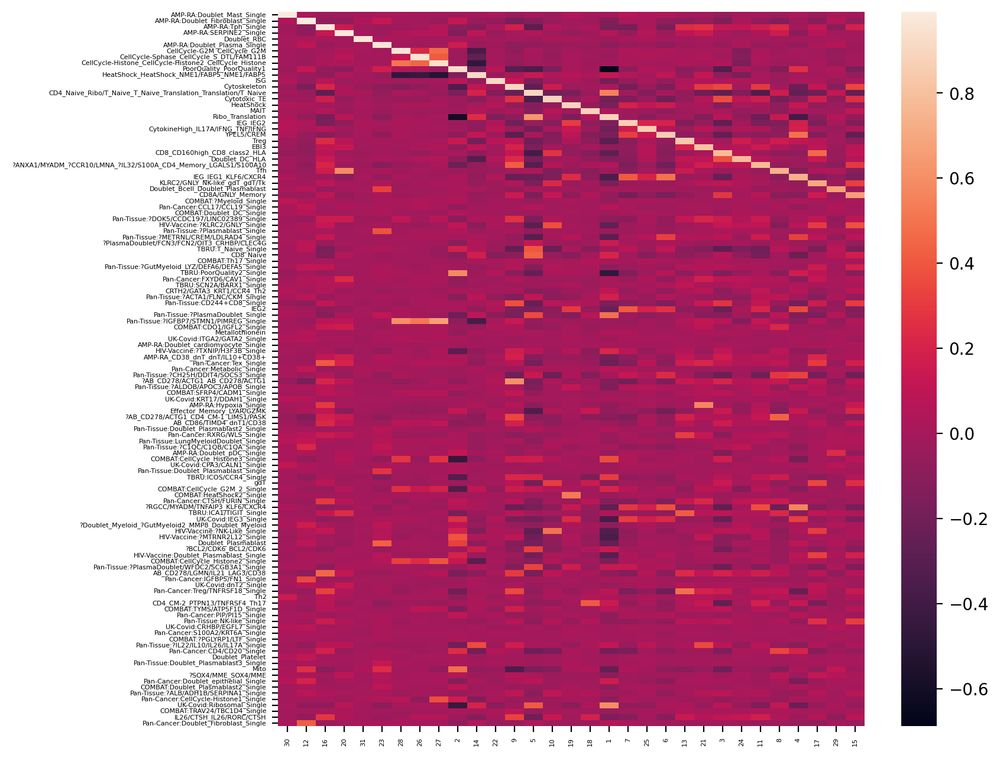

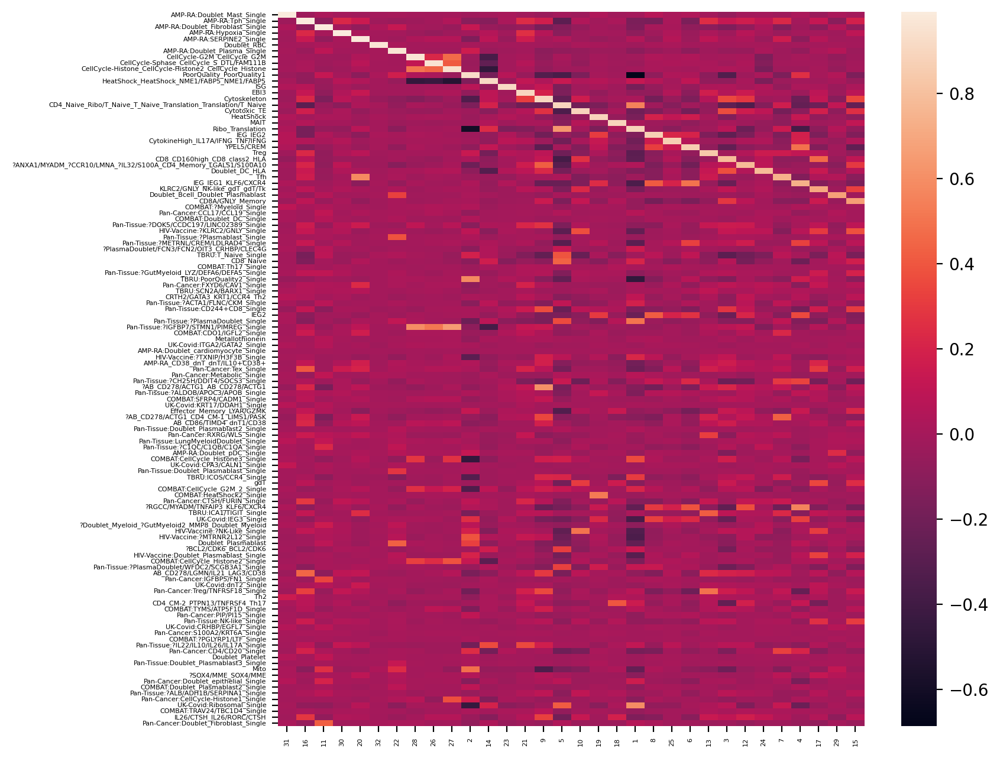

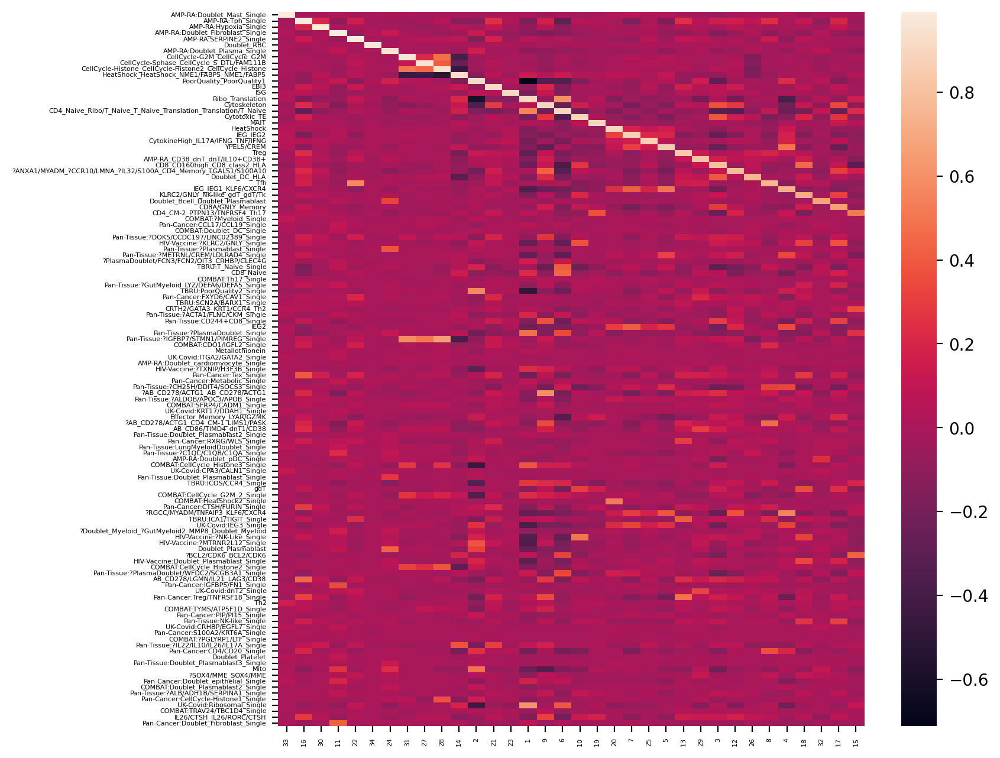

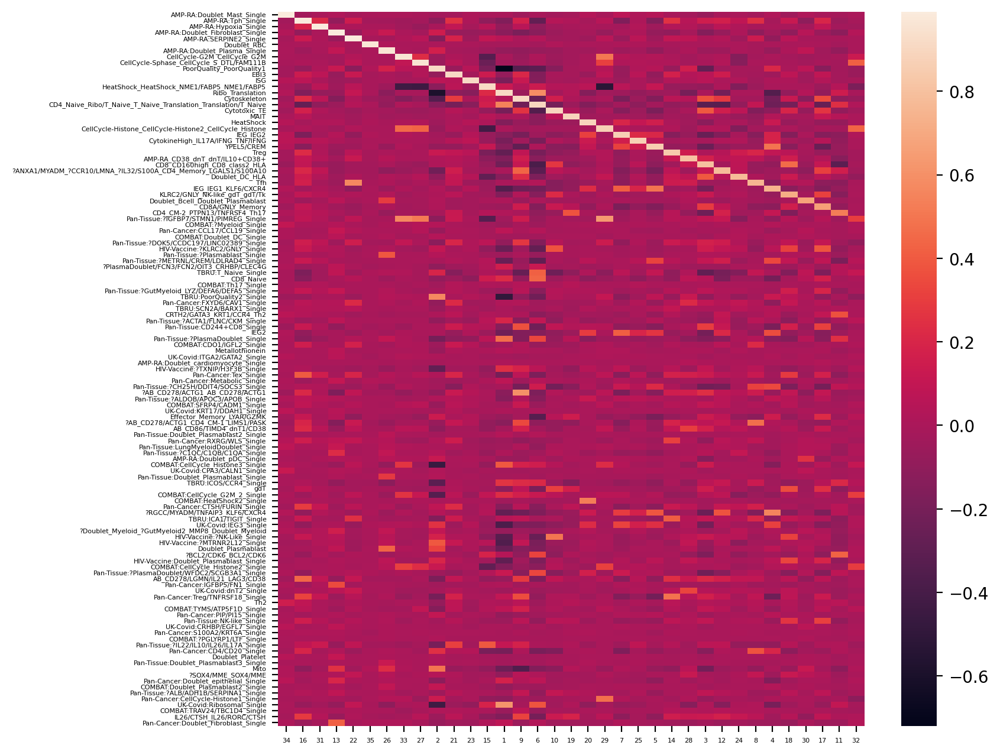

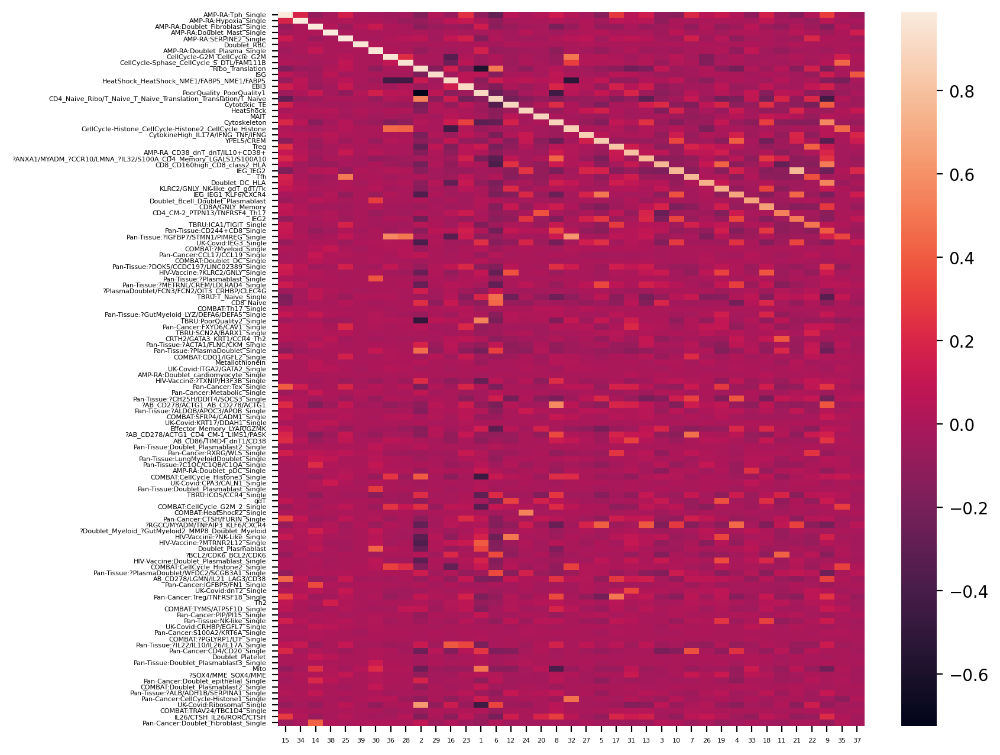

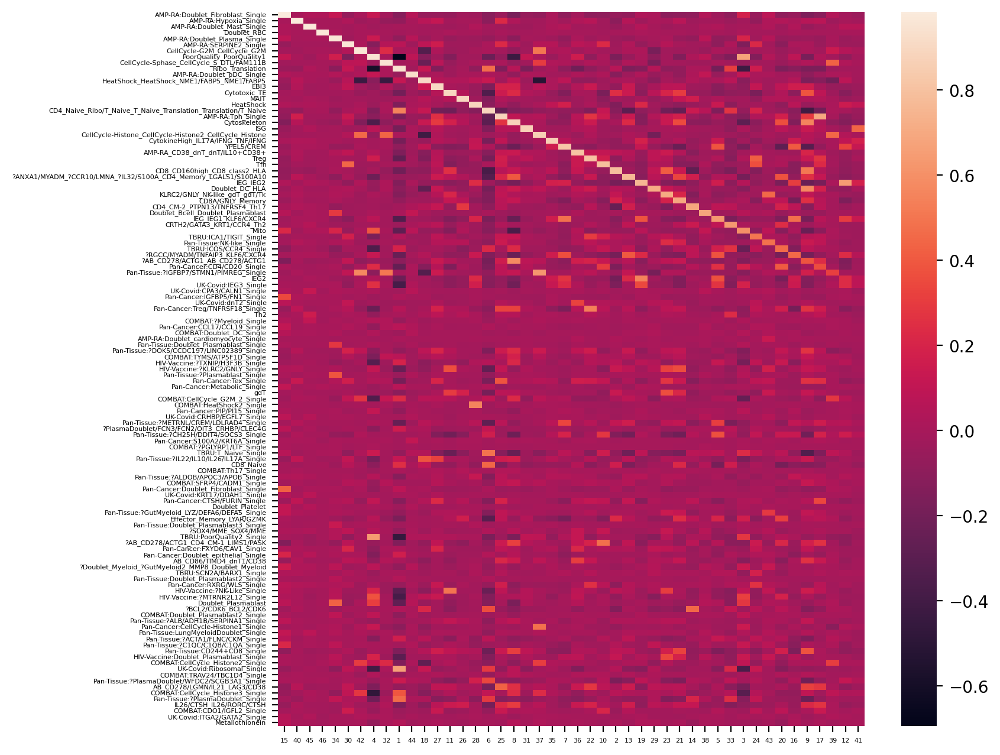

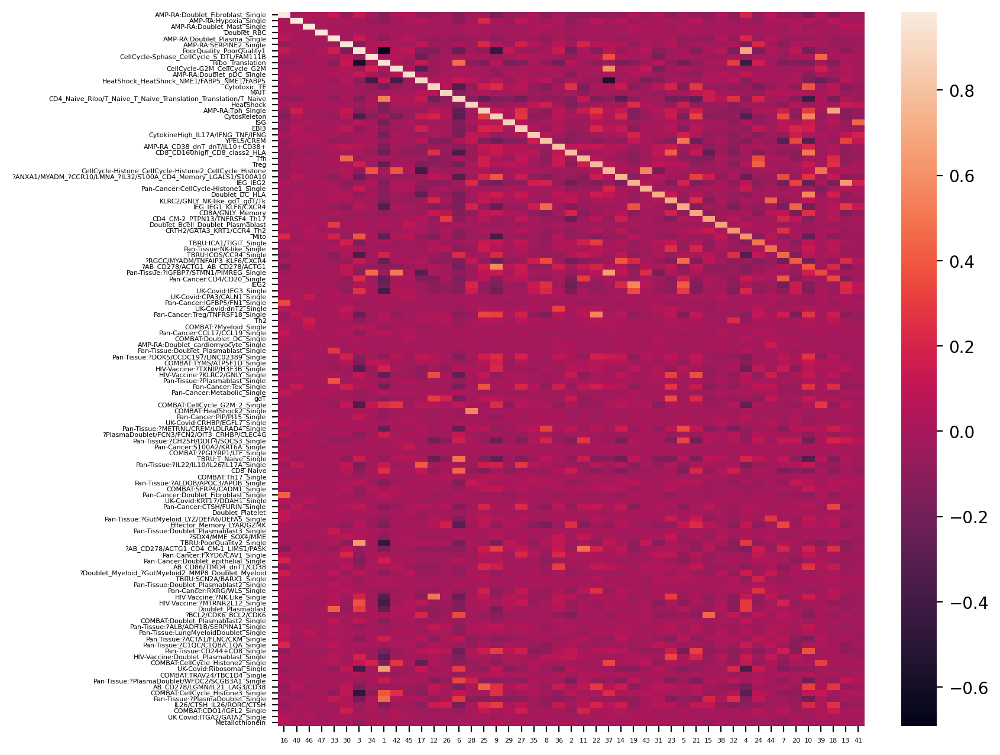

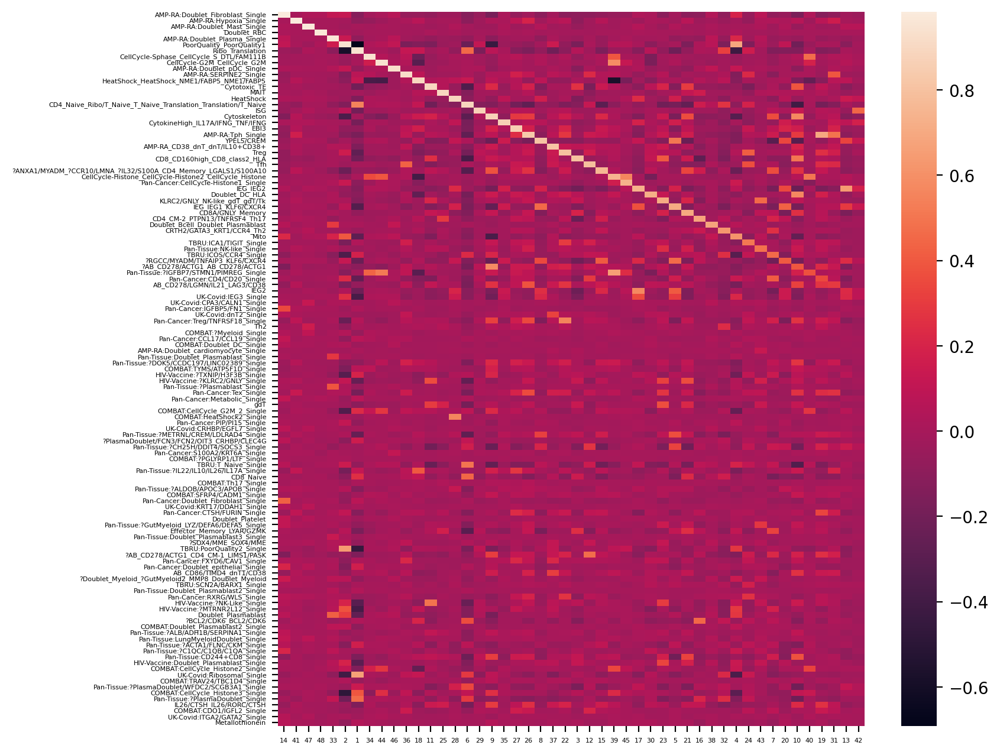

In [20]:
res = []
R_thresh = 0.55
dataset_cols = ['AMP-RA', 'UK-Covid', 'Pan-Tissue', 'HIV-Vaccine', 'COMBAT', 'TBRU', 'Pan-Cancer']
this_datset = 'AMP-RA'
other_dataset_cols = list(set(dataset_cols) - set([this_datset]))
mapping_ref = {}
top_genes_relabeled = {}

for k in kthresh.keys():
    (usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=k, density_threshold=kthresh[k])
    overlap_genes = list(set(spectra_scores.index).intersection(tcat_spectra_all.index))
    mapping, unmatched, R = match_columns(tcat_spectra_all.loc[overlap_genes, :], spectra_scores.loc[overlap_genes, :])
    R_for_plot = R.loc[list(mapping['X_columns']) + unmatched, mapping['Y_columns']]
    rename_dict = dict(zip(mapping['Y_columns'], mapping['X_columns']))
    top_genes = top_genes.rename(columns=rename_dict).loc[:, mapping['X_columns']]
    top_genes_relabeled[k] = top_genes

    fig,ax = plt.subplots(1,1, figsize=(8,8), dpi=200)
    sns.heatmap(R_for_plot, ax=ax)
    ax.set_xticks(np.arange(R_for_plot.shape[1])+0.5)
    ax.set_yticks(np.arange(R_for_plot.shape[0])+0.5)
    ax.set_xticklabels(R_for_plot.columns, fontsize=4)
    ax.set_yticklabels(R_for_plot.index, fontsize=4)

    merge_annotation = pd.merge(left=mapping, right=clustering, left_on='X_columns', right_index=True, how='outer')
    mapping_ref[k] = merge_annotation
    total_overlaps = (merge_annotation['R']>R_thresh).sum()
    ind = (merge_annotation['R']>R_thresh) & ((~merge_annotation[dataset_cols].isnull()).sum(axis=1)>1)
    nonsingleton_overlaps = ind.sum()
    this_dataset_singletons_ind = (~merge_annotation[other_dataset_cols].isnull()).sum(axis=1)==0
    recur_singleton_ind = this_dataset_singletons_ind & (merge_annotation['R']>R_thresh)
    new_singleton_match_ind = ((~merge_annotation[other_dataset_cols].isnull()).sum(axis=1)==1) & (merge_annotation['R']>R_thresh) & merge_annotation[this_datset].isnull()
    res.append([k, total_overlaps, nonsingleton_overlaps, this_dataset_singletons_ind.sum(), recur_singleton_ind.sum(), (merge_annotation['R']<R_thresh).sum(), new_singleton_match_ind.sum()])

    
    
res = pd.DataFrame(res, columns=['K', 'Num_GEP_Overlaps', 'Num_TCAT_NonSingletonOverlaps', 'Orig_TCAT_Dataset_Singletons', 'TCAT_Singletons_Found', 'New_Singletons', 'Orig_TCAT_OtherDataset_Singleton_Match'])


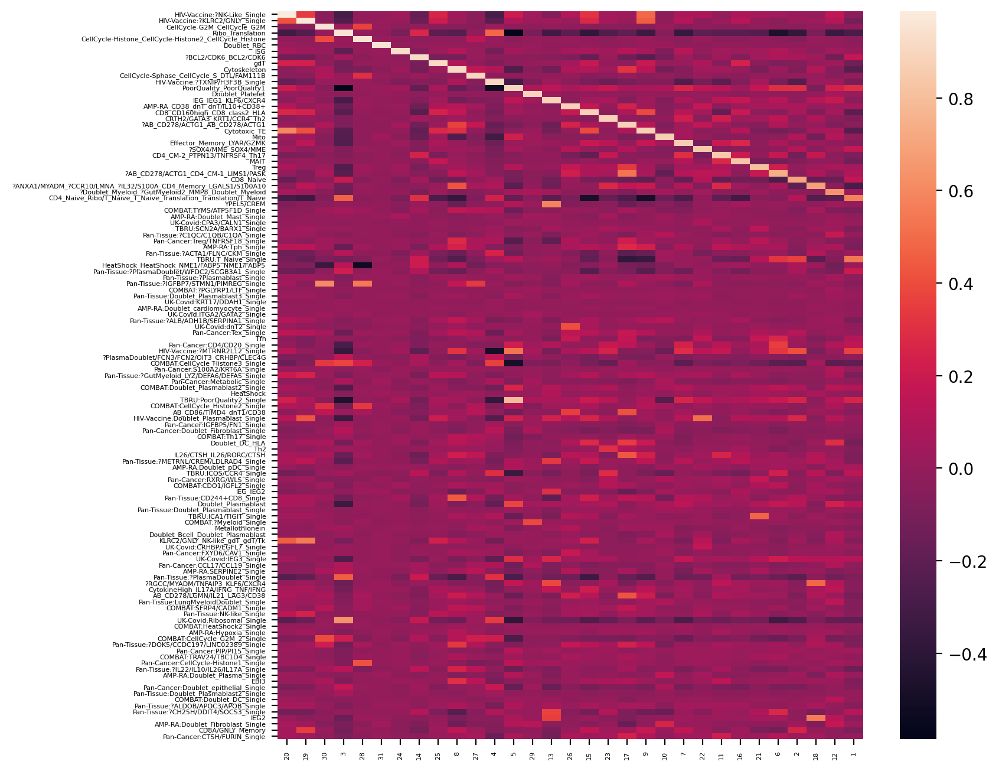

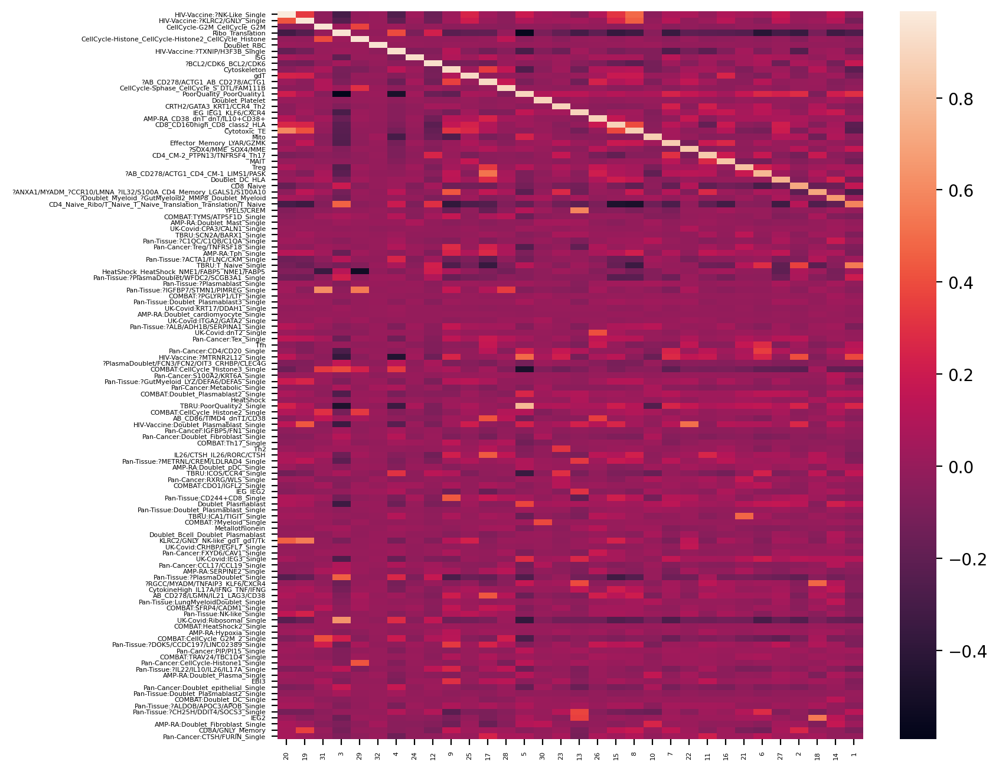

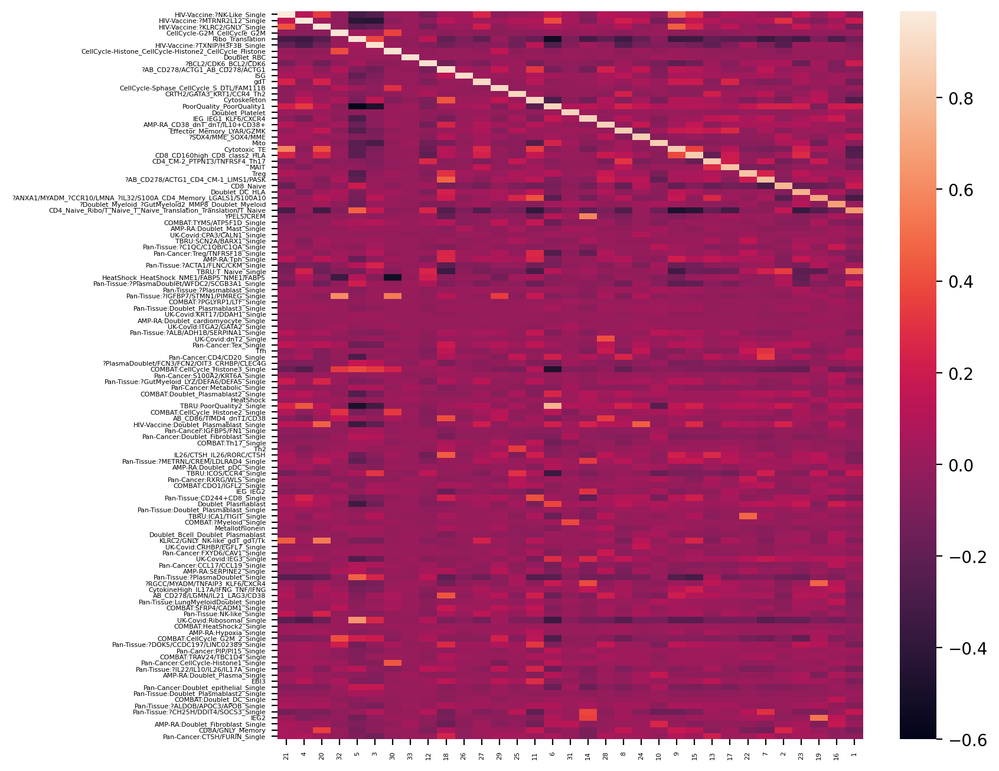

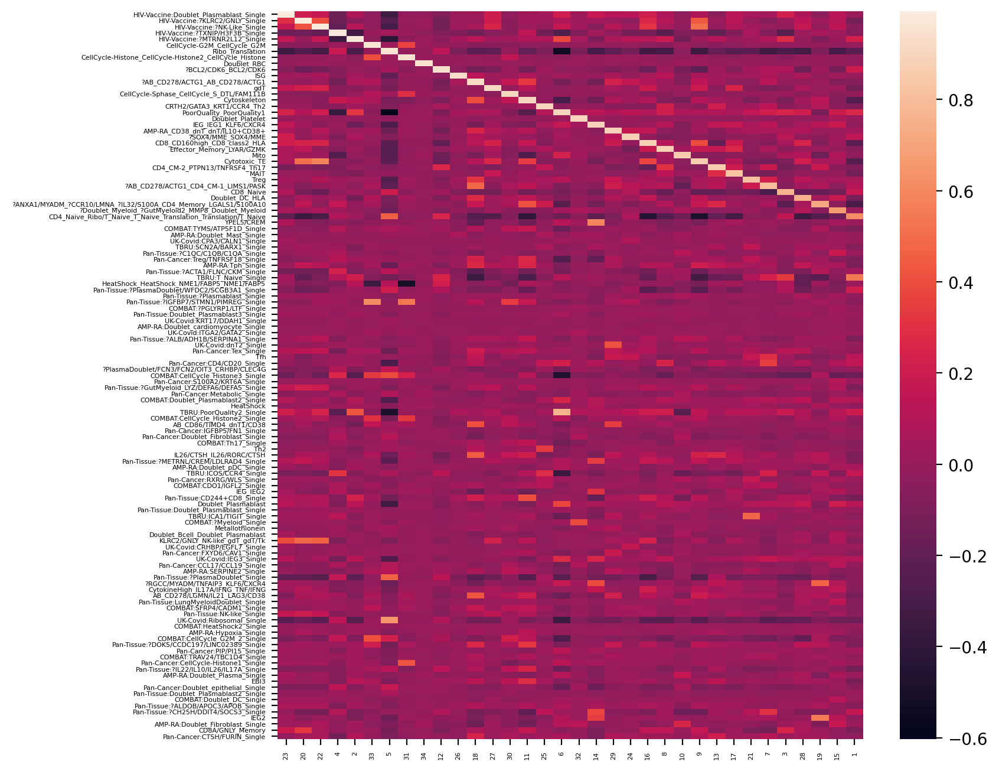

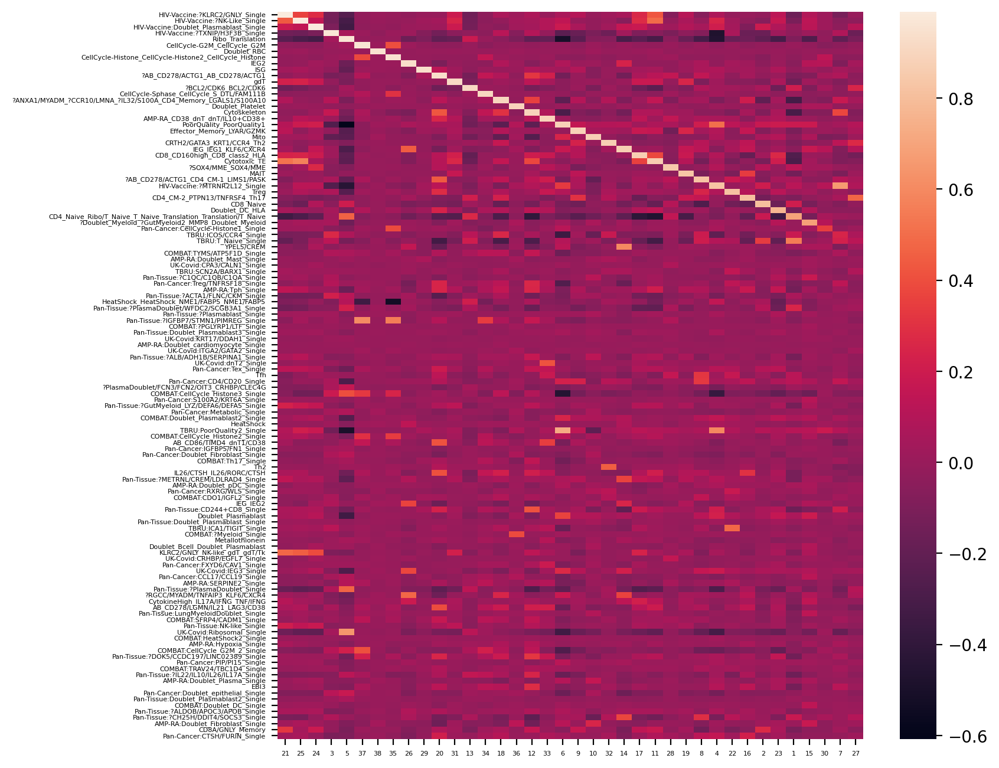

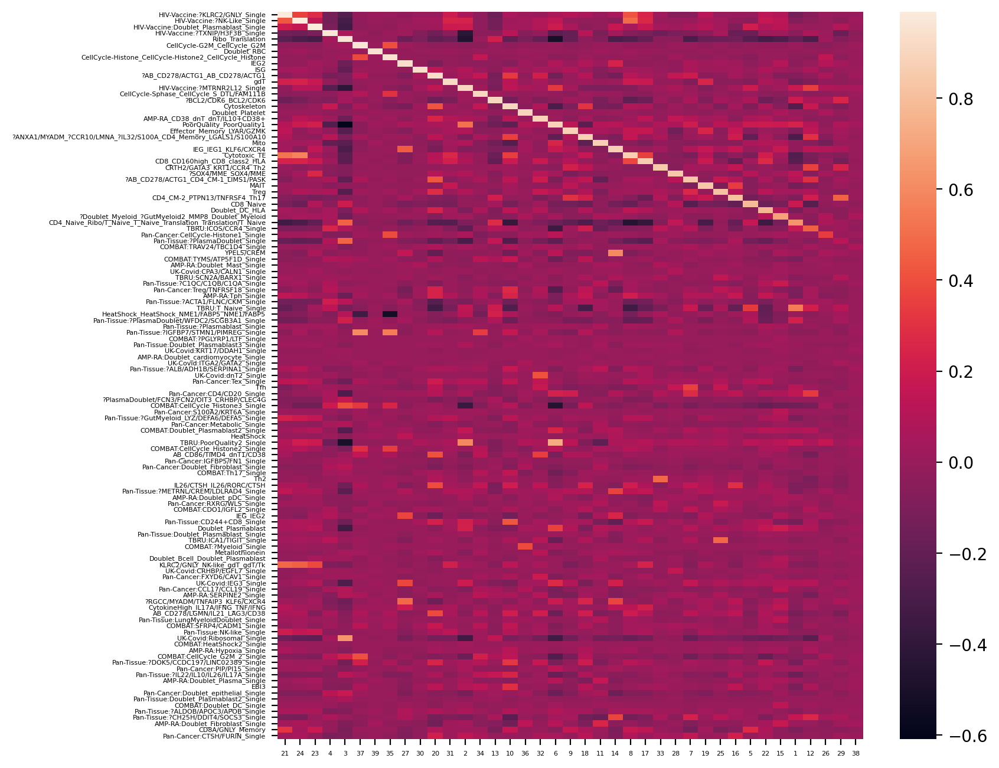

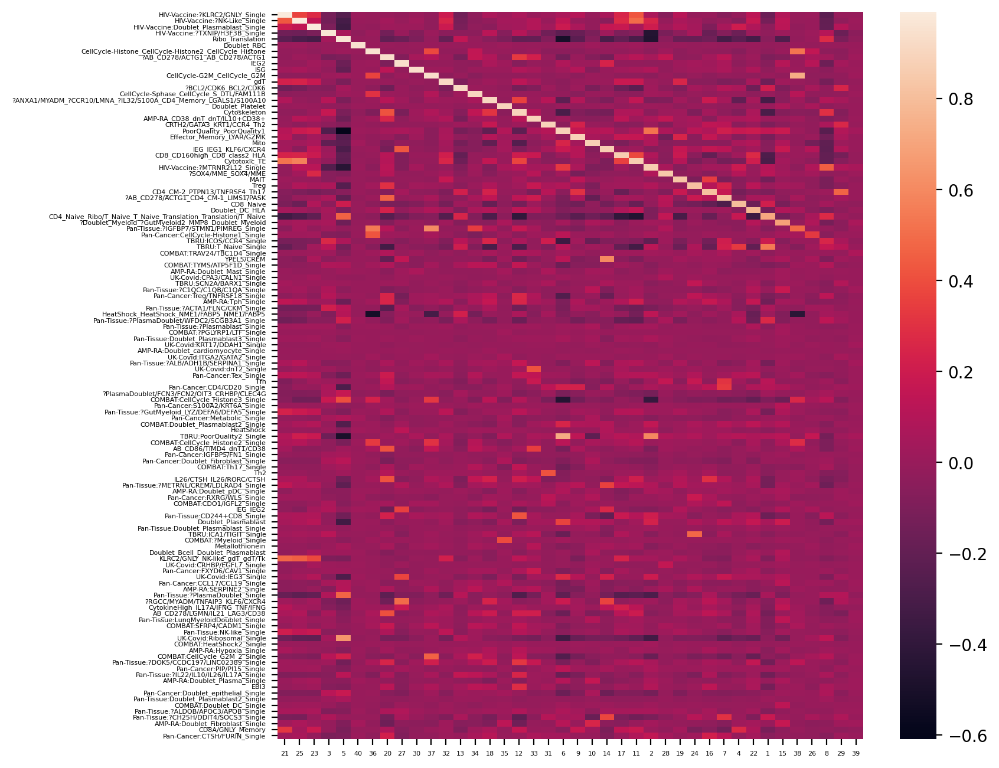

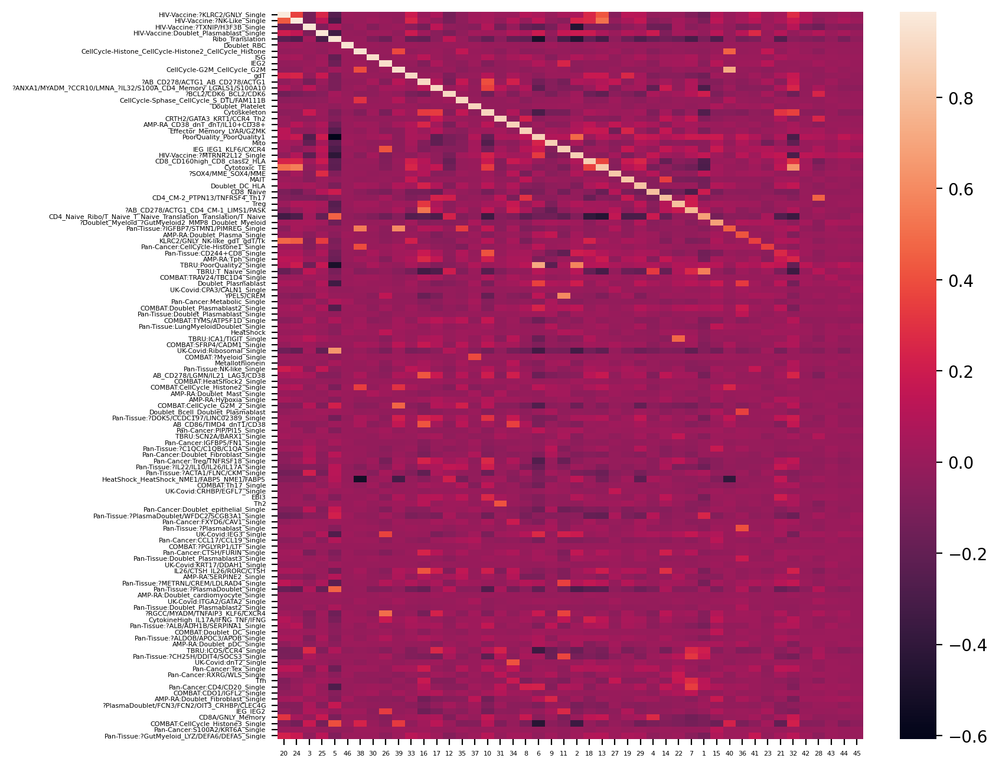

In [148]:
res = []
R_thresh = 0.55
dataset_cols = ['AMP-RA', 'UK-Covid', 'Pan-Tissue', 'HIV-Vaccine', 'COMBAT', 'TBRU', 'Pan-Cancer']
this_datset = 'AMP-RA'
other_dataset_cols = list(set(dataset_cols) - set([this_datset]))
mapping_ref = {}
top_genes_relabeled = {}

for k in [31, 32, 33, 34, 38, 39, 40, 46]:
    (usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=k, density_threshold=kthresh[k])
    overlap_genes = list(set(spectra_scores.index).intersection(tcat_spectra_all.index))
    mapping, unmatched, R = match_columns(tcat_spectra_all.loc[overlap_genes, :], spectra_scores.loc[overlap_genes, :])
    R_for_plot = R.loc[list(mapping['X_columns']) + unmatched, mapping['Y_columns']]
    rename_dict = dict(zip(mapping['Y_columns'], mapping['X_columns']))
    top_genes = top_genes.rename(columns=rename_dict).loc[:, mapping['X_columns']]
    top_genes_relabeled[k] = top_genes

    fig,ax = plt.subplots(1,1, figsize=(8,8), dpi=200)
    sns.heatmap(R_for_plot, ax=ax)
    ax.set_xticks(np.arange(R_for_plot.shape[1])+0.5)
    ax.set_yticks(np.arange(R_for_plot.shape[0])+0.5)
    ax.set_xticklabels(R_for_plot.columns, fontsize=4)
    ax.set_yticklabels(R_for_plot.index, fontsize=4)

    merge_annotation = pd.merge(left=mapping, right=clustering, left_on='X_columns', right_index=True, how='outer')
    mapping_ref[k] = merge_annotation
    total_overlaps = (merge_annotation['R']>R_thresh).sum()
    ind = (merge_annotation['R']>R_thresh) & ((~merge_annotation[dataset_cols].isnull()).sum(axis=1)>1)
    nonsingleton_overlaps = ind.sum()
    this_dataset_singletons_ind = (~merge_annotation[other_dataset_cols].isnull()).sum(axis=1)==0
    recur_singleton_ind = this_dataset_singletons_ind & (merge_annotation['R']>R_thresh)
    new_singleton_match_ind = ((~merge_annotation[other_dataset_cols].isnull()).sum(axis=1)==1) & (merge_annotation['R']>R_thresh) & merge_annotation[this_datset].isnull()
    res.append([k, total_overlaps, nonsingleton_overlaps, this_dataset_singletons_ind.sum(), recur_singleton_ind.sum(), (merge_annotation['R']<R_thresh).sum(), new_singleton_match_ind.sum()])

    
    
res = pd.DataFrame(res, columns=['K', 'Num_GEP_Overlaps', 'Num_TCAT_NonSingletonOverlaps', 'Orig_TCAT_Dataset_Singletons', 'TCAT_Singletons_Found', 'New_Singletons', 'Orig_TCAT_OtherDataset_Singleton_Match'])


In [22]:
res

,K,Num_GEP_Overlaps,Num_TCAT_NonSingletonOverlaps,Orig_TCAT_Dataset_Singletons,TCAT_Singletons_Found,New_Singletons,Orig_TCAT_OtherDataset_Singleton_Match
0,31,31,26,8,5,0,0
1,32,32,26,8,6,0,0
2,34,33,27,8,6,1,0
3,35,33,27,8,6,2,0
4,39,33,27,8,6,6,0
5,46,37,30,8,7,9,0
6,47,38,30,8,7,9,1
7,48,38,30,8,7,10,1


In [23]:
set(mapping_ref[34].loc[mapping_ref[34]['R']>R_thresh, 'X_columns']) - set(mapping_ref[32].loc[mapping_ref[32]['R']>R_thresh, 'X_columns'])

{'AMP-RA_CD38_dnT_dnT/IL10+CD38+'}

In [35]:
set(mapping_ref[34].loc[mapping_ref[34]['R']>R_thresh, 'X_columns']) - set(mapping_ref[31].loc[mapping_ref[31]['R']>R_thresh, 'X_columns'])

{'AMP-RA:Hypoxia_Single', 'AMP-RA_CD38_dnT_dnT/IL10+CD38+'}

In [34]:
mapping_ref[34].loc[mapping_ref[34]['X_columns']=='AMP-RA_CD38_dnT_dnT/IL10+CD38+', :]

,Y_columns,X_columns,R,AMP-RA,UK-Covid,Pan-Tissue,HIV-Vaccine,COMBAT,TBRU,Pan-Cancer
3365.0,29.0,AMP-RA_CD38_dnT_dnT/IL10+CD38+,0.811199,AMP-RA:CD38,NaN,Pan-Tissue:AMP-RA:CD38,HIV-Vaccine:dnT/IL10+CD38+,COMBAT:dnT,TBRU:dnT,NaN


In [26]:
mapping_ref[35][mapping_ref[35]['R']<R_thresh]

,Y_columns,X_columns,R,AMP-RA,UK-Covid,Pan-Tissue,HIV-Vaccine,COMBAT,TBRU,Pan-Cancer
1222.0,11.0,CD4_CM-2_PTPN13/TNFRSF4_Th17,0.529022,NaN,UK-Covid:Th17,NaN,HIV-Vaccine:Th17,COMBAT:CD4_CM-2,TBRU:PTPN13/TNFRSF4,NaN
3801.0,32.0,Pan-Tissue:?IGFBP7/STMN1/PIMREG_Single,0.302405,NaN,NaN,Pan-Tissue:?IGFBP7/STMN1/PIMREG,NaN,NaN,NaN,NaN


In [28]:
top_genes_relabeled[35][mapping_ref[35][mapping_ref[35]['R']<R_thresh]['X_columns']].head(40)

,CD4_CM-2_PTPN13/TNFRSF4_Th17,Pan-Tissue:?IGFBP7/STMN1/PIMREG_Single
0,NEFL,RRM2
1,LTB,TYMS
2,KRT1,PCLAF
3,USP10,TUBA1B
4,SOCS2,CDCA5
5,FAM13A,STMN1
6,FUT7,SPC25
7,OSM,HIST1H4C
8,PTGDR2,TK1
9,PTGER2,ZWINT


In [36]:
set(mapping_ref[32].loc[mapping_ref[32]['R']>R_thresh, 'X_columns']) - set(mapping_ref[31].loc[mapping_ref[31]['R']>R_thresh, 'X_columns'])

{'AMP-RA:Hypoxia_Single'}

In [37]:
set(mapping_ref[46].loc[mapping_ref[46]['R']>R_thresh, 'X_columns']) - set(mapping_ref[34].loc[mapping_ref[34]['R']>R_thresh, 'X_columns'])


{'AMP-RA:Doublet_pDC_Single',
 'CD4_CM-2_PTPN13/TNFRSF4_Th17',
 'CRTH2/GATA3_KRT1/CCR4_Th2',
 'Mito'}

In [38]:
mapping_ref[46].loc[mapping_ref[46]['X_columns']=='CD4_CM-2_PTPN13/TNFRSF4_Th17', :]

,Y_columns,X_columns,R,AMP-RA,UK-Covid,Pan-Tissue,HIV-Vaccine,COMBAT,TBRU,Pan-Cancer
1579.0,14.0,CD4_CM-2_PTPN13/TNFRSF4_Th17,0.685793,NaN,UK-Covid:Th17,NaN,HIV-Vaccine:Th17,COMBAT:CD4_CM-2,TBRU:PTPN13/TNFRSF4,NaN


In [42]:
top_genes_relabeled[46]['CD4_CM-2_PTPN13/TNFRSF4_Th17'].head(30)

0           CCR6
1          USP10
2            LTB
3     TTC39C-AS1
4          SOCS2
5         FAM13A
6           AQP3
7           IL7R
8           CTSH
9           CISH
10           OSM
11        PTGER2
12          FUT7
13          AIRE
14          NSG1
15           MAL
16           CR1
17         HBEGF
18      AB_CD127
19       SLC40A1
20         CMTM6
21          CD55
22         ITGB1
23         TRADD
24          BCL2
25         NPDC1
26         GREM2
27          DPP4
28         AP3M2
29        ADAM23
Name: CD4_CM-2_PTPN13/TNFRSF4_Th17, dtype: object

In [39]:
mapping_ref[46].loc[mapping_ref[46]['X_columns']=='CRTH2/GATA3_KRT1/CCR4_Th2', :]

,Y_columns,X_columns,R,AMP-RA,UK-Covid,Pan-Tissue,HIV-Vaccine,COMBAT,TBRU,Pan-Cancer
3842.0,33.0,CRTH2/GATA3_KRT1/CCR4_Th2,0.630426,NaN,UK-Covid:KRT1/CCR4,NaN,HIV-Vaccine:Th2,COMBAT:Th2,TBRU:CRTH2/GATA3,NaN


In [41]:
top_genes_relabeled[46]['CRTH2/GATA3_KRT1/CCR4_Th2'].head(30)

0          KRT1
1        PTGDR2
2          NEFL
3        RPS4Y1
4     GATA3-AS1
5         EGLN3
6     TMPRSS11E
7          EDN3
8        IL17RB
9         GATA3
10     C1orf162
11        FXYD7
12       ADAM23
13          ZP1
14         SELL
15         RPSA
16        NOSIP
17        SUSD4
18        DDX3Y
19       HDGFL3
20      TNFSF10
21         IL13
22       EIF1AY
23       RPL13A
24         DSEL
25       AKAP12
26        RUNX2
27         FUT7
28        CCR10
29          CLC
Name: CRTH2/GATA3_KRT1/CCR4_Th2, dtype: object

In [33]:
set(mapping_ref[48].loc[mapping_ref[48]['R']>R_thresh, 'X_columns']) - set(mapping_ref[46].loc[mapping_ref[46]['R']>R_thresh, 'X_columns'])


{'Pan-Cancer:CellCycle-Histone1_Single'}

# K=34

mv -i AMPRA.20230912.Iter200 AMPRA.20230912.Iter200_k31

In [4]:
cnmfdir = '../../../Data/PerDataset/AMPRA'
name = 'AMPRA.20230912.Iter200'

In [64]:
cnmf_count_fn = paths['RNA_Varnorm_Harmony']
cnmf_tpm_fn = paths['RNA_and_ADT_TP10K']
hvg_fn = paths['RNA_HVG_List']

jname = name
cnmfout = os.path.join(cnmfdir, name, 'log')

Ks = np.arange(34, 35)
n_iter = 200
num_per_node = 4

In [65]:
total_workers = int((len(Ks)*n_iter) / num_per_node)
total_workers

50

In [66]:
cnmfdir, name

('../../../Data/PerDataset/AMPRA', 'AMPRA.20230912.Iter200')

In [5]:
cnmf_obj = cNMF(output_dir=cnmfdir, name=name)

In [69]:
cnmf_obj.prepare(counts_fn=cnmf_count_fn, components=Ks,
                 n_iter=n_iter, tpm_fn=cnmf_tpm_fn, genes_file=hvg_fn, init='random')

Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.HarmonyGeneCorrect', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].


In [70]:
if not os.path.exists(cnmfout): os.mkdir(cnmfout)

basecmd = "export OMP_NUM_THREADS=6; cnmf factorize --name {name} --output-dir {outdir} --total-workers {tw} --worker-index {i}"
q = 'short'
other = '-R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]"'

for i in range(total_workers):
    cmd = basecmd.format(name=name, outdir=cnmfdir, i=i, tw=total_workers)
    e = os.path.join(cnmfout, '{j}.{i}.err.txt').format(i=i, j=jname)
    o = os.path.join(cnmfout, '{j}.{i}.out.txt').format(i=i, j=jname)
    bsub_cmd = 'bsub -q {q} -J {j} -o {o} -e {e} {other} "{cmd}"'.format(q=q, j=jname, e=e, o=o, other=other, cmd=cmd)
    print(bsub_cmd)
    !{bsub_cmd}

bsub -q short -J AMPRA.20230912.Iter200 -o ../../../Data/PerDataset/AMPRA/AMPRA.20230912.Iter200/log/AMPRA.20230912.Iter200.0.out.txt -e ../../../Data/PerDataset/AMPRA/AMPRA.20230912.Iter200/log/AMPRA.20230912.Iter200.0.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!=cn007]" "export OMP_NUM_THREADS=6; cnmf factorize --name AMPRA.20230912.Iter200 --output-dir ../../../Data/PerDataset/AMPRA --total-workers 50 --worker-index 0"
Job <857366> is submitted to queue <short>.
bsub -q short -J AMPRA.20230912.Iter200 -o ../../../Data/PerDataset/AMPRA/AMPRA.20230912.Iter200/log/AMPRA.20230912.Iter200.1.out.txt -e ../../../Data/PerDataset/AMPRA/AMPRA.20230912.Iter200/log/AMPRA.20230912.Iter200.1.err.txt -R "rusage[mem=2000]" -R "select[hname!=cn001]" -R "select[hname!=cn002]" -R "select[hname!=cn003]" -R "select[hname!=cn004]" -R "select[hname!=cn005]" -R "select[hname!

In [74]:
! bjobs | wc -l

2


In [ ]:
! bjobs | wc -l

In [75]:
total_workers = int((len(Ks)*n_iter))
total_workers

200

In [76]:
import os
def worker_filter(iterable, worker_index, total_workers):
    return (p for i,p in enumerate(iterable) if (i-worker_index)%total_workers==0)

def load_df_from_npz(filename):
    with np.load(filename, allow_pickle=True) as f:
        obj = pd.DataFrame(**f)
    return obj

missing = []
run_params = load_df_from_npz(cnmf_obj.paths['nmf_replicate_parameters'])
for worker_i in range(total_workers):
    jobs_for_this_worker = worker_filter(range(len(run_params)), worker_i, total_workers)
    for idx in jobs_for_this_worker:
        p = run_params.iloc[idx, :]
        outfn = cnmf_obj.paths['iter_spectra'] % (p['n_components'], p['iter'])
        if not os.path.exists(outfn):
            #print(worker_i, outfn)
            missing.append(worker_i)
            
len(missing)

0

In [77]:
missing

[]

In [ ]:
total_workers = int((len(Ks)*n_iter))
total_workers

In [ ]:
for i in missing:
    cmd = basecmd.format(name=name, outdir=cnmfdir, i=i, tw=total_workers)
    e = os.path.join(cnmfout, '{j}.{i}.err.txt').format(i=i, j=jname)
    o = os.path.join(cnmfout, '{j}.{i}.out.txt').format(i=i, j=jname)
    bsub_cmd = 'bsub -q {q} -J {j} -o {o} -e {e} {other} "{cmd}"'.format(q=q, j=jname, e=e, o=o, other=other, cmd=cmd)
    print(bsub_cmd)
    !{bsub_cmd}

## Look at the results for K=34 with 200 iterations

In [78]:
cnmf_obj.combine(skip_missing_files=True)

Combining factorizations for k=34.


Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.norm_counts', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].
Only considering the two last: ['.tpm', '.h5ad'].


/PHShome/mc1070/anaconda3/envs/cnmfdev_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


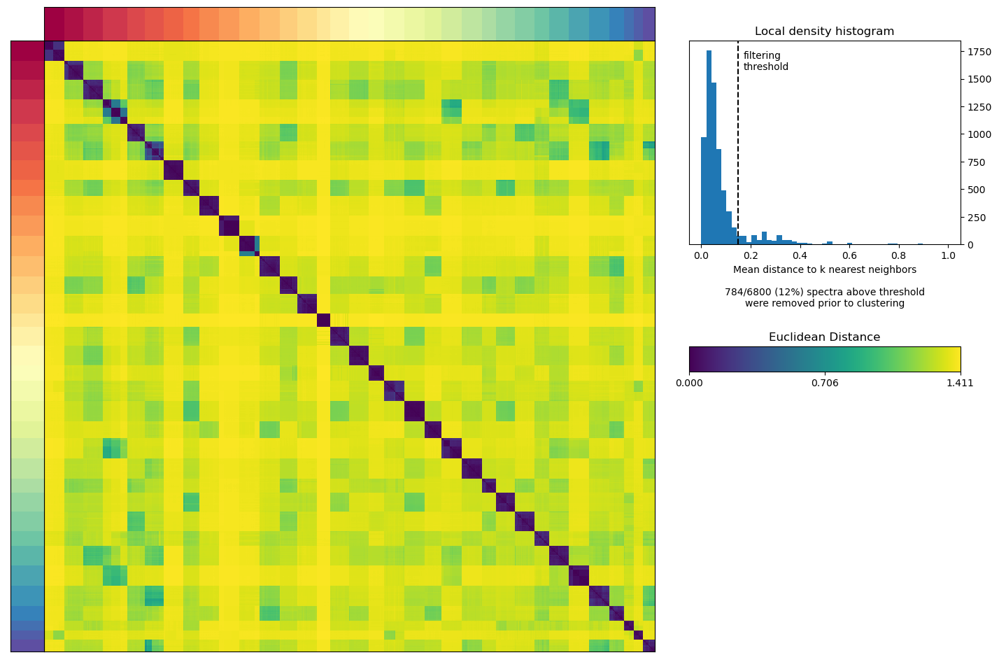

In [79]:
cnmf_obj.consensus(k=34, density_threshold=0.15)

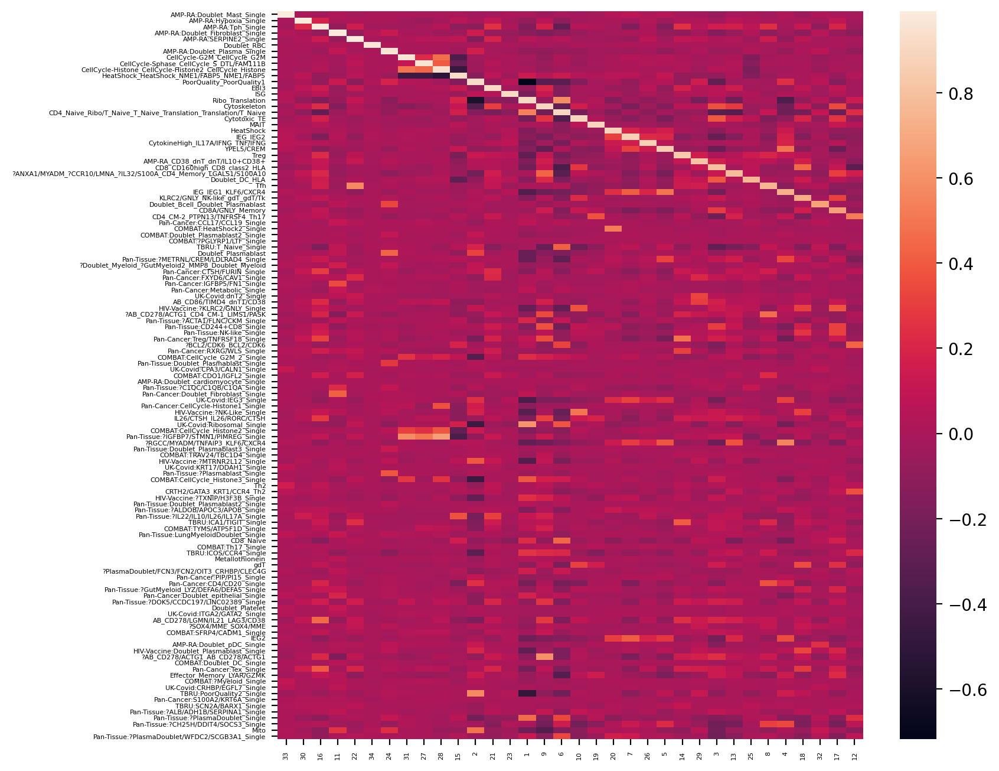

In [80]:
(usage, spectra_scores, spectra_tpm, top_genes) = cnmf_obj.load_results(K=34, density_threshold=0.15)
overlap_genes = list(set(spectra_scores.index).intersection(tcat_spectra_all.index))
mapping, unmatched, R = match_columns(tcat_spectra_all.loc[overlap_genes, :], spectra_scores.loc[overlap_genes, :])
R_for_plot = R.loc[list(mapping['X_columns']) + unmatched, mapping['Y_columns']]
rename_dict = dict(zip(mapping['Y_columns'], mapping['X_columns']))

fig,ax = plt.subplots(1,1, figsize=(8,8), dpi=200)
sns.heatmap(R_for_plot, ax=ax)
ax.set_xticks(np.arange(R_for_plot.shape[1])+0.5)
ax.set_yticks(np.arange(R_for_plot.shape[0])+0.5)
ax.set_xticklabels(R_for_plot.columns, fontsize=4)
_ = ax.set_yticklabels(R_for_plot.index, fontsize=4)

In [81]:
res = []
k=34
merge_annotation = pd.merge(left=mapping, right=clustering, left_on='X_columns', right_index=True, how='outer')
mapping_ref[k] = merge_annotation
total_overlaps = (merge_annotation['R']>R_thresh).sum()
ind = (merge_annotation['R']>R_thresh) & ((~merge_annotation[dataset_cols].isnull()).sum(axis=1)>1)
nonsingleton_overlaps = ind.sum()
this_dataset_singletons_ind = (~merge_annotation[other_dataset_cols].isnull()).sum(axis=1)==0
recur_singleton_ind = this_dataset_singletons_ind & (merge_annotation['R']>R_thresh)
new_singleton_match_ind = ((~merge_annotation[other_dataset_cols].isnull()).sum(axis=1)==1) & (merge_annotation['R']>R_thresh) & merge_annotation[this_datset].isnull()
res.append([k, total_overlaps, nonsingleton_overlaps, this_dataset_singletons_ind.sum(), recur_singleton_ind.sum(), (merge_annotation['R']<R_thresh).sum(), new_singleton_match_ind.sum()])

    
    
res = pd.DataFrame(res, columns=['K', 'Num_GEP_Overlaps', 'Num_TCAT_NonSingletonOverlaps', 'Orig_TCAT_Dataset_Singletons', 'TCAT_Singletons_Found', 'New_Singletons', 'Orig_TCAT_OtherDataset_Singleton_Match'])
res

,K,Num_GEP_Overlaps,Num_TCAT_NonSingletonOverlaps,Orig_TCAT_Dataset_Singletons,TCAT_Singletons_Found,New_Singletons,Orig_TCAT_OtherDataset_Singleton_Match
0,34,33,27,8,6,1,0


In [82]:
os.path.abspath(cnmfdir)

'/data/srlab1/TCAT/Data/PerDataset/AMPRA'

In [83]:
name

'AMPRA.20230912.Iter200'

In [84]:
os.path.abspath('.')

'/data/srlab1/TCAT/Analysis/PerDataset/AMPRA'

In [85]:
gep_info = read_dataset_log('GEP_Name')
gep_info.index = gep_info['MetaGep_Name']
gep_info.head()

,MetaGep_Name,Long_Name,Short_Name,Needs Review,Class,Num_Datasets,Flag
MetaGep_Name,,,,,,,
CellCycle-G2M_CellCycle_G2M,CellCycle-G2M_CellCycle_G2M,Cell Cycle G2M Phase,CellCycle-G2M,NaN,Known Activity,7,NaN
ISG,ISG,Interferon Stimulated Genes,ISG,NaN,Known Activity,7,NaN
gdT,gdT,Gamma Delta T Blood,gdT-Blood,NaN,Known Lineage,4,NaN
Metallothionein,Metallothionein,Metallothionein,Metallothionein,NaN,Known Activity,5,NaN
CellCycle-Sphase_CellCycle_S_DTL/FAM111B,CellCycle-Sphase_CellCycle_S_DTL/FAM111B,Cell Cycle S Phase,CellCycle-S,NaN,Known Activity,7,NaN


In [89]:
gep2meta = dict(zip(mapping['Y_columns'], mapping['X_columns']))
meta2rename = dict(zip(gep_info['MetaGep_Name'], gep_info['Short_Name']))
# meta2rename['HIV-Vaccine:?TXNIP/H3F3B_Single'] = 'HIV-Vaccine:?TXNIP/H3F3B_Single'
for key in set(gep2meta.values()).difference(meta2rename.keys()):
    meta2rename[key] = key
gep2rename = {g:meta2rename[gep2meta[g]] for g in gep2meta.keys()}

In [103]:
usage_rename = usage.rename(columns=gep2rename)
spectra_scores_rename = spectra_scores.rename(columns=gep2rename)
spectra_tpm_rename = spectra_tpm.rename(columns=gep2rename)

In [106]:
for dat, lab in [(usage_rename, 'Usage'), (spectra_scores_rename, 'Spectra_Scores'), (spectra_tpm_rename, 'Spectra_TPM')]:
    fn = os.path.join(cnmfdir, name +'.'+lab+'.Relabeled.tsv')
    print(os.path.abspath(fn))
    dat.to_csv(fn, sep='\t')

/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA.20230912.Iter200.Usage.Relabeled.tsv
/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA.20230912.Iter200.Spectra_Scores.Relabeled.tsv
/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA.20230912.Iter200.Spectra_TPM.Relabeled.tsv


In [107]:
top_genes_relabed = {}
for g in spectra_scores_rename.columns:
    top_genes_relabed[g] = spectra_scores_rename[g].sort_values(ascending=False).iloc[:50].index
    
top_genes_relabed = pd.DataFrame.from_dict(top_genes_relabed).T

In [108]:
top_genes_relabed

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Translation,RPS12,RPS18,RPS2,RPLP1,RPS27A,RPL41,RPL11,RPL10,RPL13,RPS3,...,RPSA,RPL39,RPL8,RPL14,RPL21,RPLP2,RPS25,RPS27,RPLP0,RPL5
MALAT1,MALAT1,SYNE2,NKTR,DDX17,MACF1,AHNAK,MIAT,KIAA1551,N4BP2L2,RNF213,...,AKAP9,OGT,GABPB1-AS1,ATRX,PNN,ANKRD44,HNRNPH1,ACAP1,MT-ND4,AKNA
CD8_EM,GZMK,GZMA,CCL5,CST7,CD8A,CD8B,HLA-DPB1,HLA-DPA1,NKG7,HLA-DRB1,...,ATP5F1E,C12orf75,AB_CD31,CLIC1,AOAH,LYAR,OAZ1,ITM2C,DTHD1,ARPC5L
IEG,TNFAIP3,CXCR4,KLF6,ZFP36,NFKBIA,SAMSN1,RGCC,TENT5C,ZFP36L2,RGS1,...,PIK3R1,ATF3,PFKFB3,DUSP1,NAMPT,CLEC2B,SC5D,ARL4C,JUNB,IRF1
YPEL5/CREM,YPEL5,ZNF331,BCAS2,PRMT9,CYCS,RNF139,SELENOK,CHMP1B,RANBP2,NR4A2,...,FTH1,PGAP1,IRS2,ARL5B,ZBTB10,ZDBF2,UBE2S,HES4,ANKRD37,GOLGB1
CD4-Naive,FHIT,LEF1,CCR7,SELL,RPS3A,RPS13,ACTN1,RPS8,RPS6,TXK,...,TPT1,RPLP2,RPS16,RPL29,RPS28,NACA,RPS20,LRRN3,LDHB,RPS15A
IEG-Tissue,IER2,JUN,FOSB,EGR1,GADD45B,UBE2S,TUBB4B,SERTAD1,BTG2,FOS,...,CD83,DDX3X,HSPA8,ZFP36,FAM53C,TUBA1A,EIF4A2,KCNQ1OT1,YME1L1,UBC
Tfh,PVALB,NR3C1,AB_CD279,FKBP5,THADA,TOX2,TSHZ2,PTPN13,DRAIC,IL6ST,...,TBC1D4,RNASET2,SLC9A9,SESN3,METTL8,BTLA,FBLN7,SRGN,CPM,NAB1
Cytoskeleton,ACTG1,ACTB,PFN1,TMSB10,TMSB4X,CORO1A,MYL6,CFL1,COTL1,ARPC1B,...,S100A11,JPT1,GMFG,ATP5MC3,ARPC4,FKBP1A,SERF2,PSMA7,PSME1,PSMA4
Cytotoxic,FGFBP2,CX3CR1,GZMH,NKG7,PRF1,GNLY,FCGR3A,KLRD1,EFHD2,PLEK,...,ADRB2,CTSW,HOPX,HLA-B,SSBP3,LILRB1,CD300A,VCL,KLF3,HLA-C
